# Prerequisites

### Authenticating to GCP client libraries
GCP client libraries use a strategy called Application Default Credentials (ADC) to find your application's credentials. When your code uses a client library, the strategy checks for your credentials in the following order:

First, ADC checks to see if the environment variable GOOGLE_APPLICATION_CREDENTIALS is set. If the variable is set, ADC uses the service account file that the variable points to.

If the environment variable isn't set, ADC uses the default service account that Compute Engine, Kubernetes Engine, App Engine, and Cloud Functions provide, for applications that run on those services.

If ADC can't use either of the above credentials, an error occurs.
* https://cloud.google.com/docs/authentication/production
* Set environment variable 'GOOGLE_APPLICATION_CREDENTIALS'

### Grant privileges to AmazonSageMaker-ExecutionRole 

### Required Packages
* setuptools
* pyasn1

### Download GCP Python sample codes
This repository holds the samples used in the python documentation on cloud.google.com.
* https://github.com/GoogleCloudPlatform/python-docs-samples
* git clone https://github.com/GoogleCloudPlatform/python-docs-samples.git
* In order to execute sample codes, you must install Google Cloud client library by "pip install --upgrade google-cloud-*"

In [333]:
import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "YOUR CREDENTIALS"
#!git clone https://github.com/GoogleCloudPlatform/python-docs-samples.git
#!pip install setuptools
#!pip install pyasn1

# Google Cloud Vision
Google Cloud Vision API enables developers to understand the content of an image by encapsulating powerful machine learning models in an easy to use REST API. It quickly classifies images into thousands of categories (e.g., "sailboat", "lion", "Eiffel Tower"), detects individual objects and faces within images, and finds and reads printed words contained within images. You can build metadata on your image catalog, moderate offensive content, or enable new marketing scenarios through image sentiment analysis. Analyze images uploaded in the request or integrate with your image storage on Google Cloud Storage.
* Web: https://tinyurl.com/ybmhslrl

Image specifies the image file. It can be sent as a base64-encoded string, a Google Cloud Storage file location, or as a publicly-accessible URL. See Providing the image for details.
* https://cloud.google.com/vision/docs/request#providing_the_image

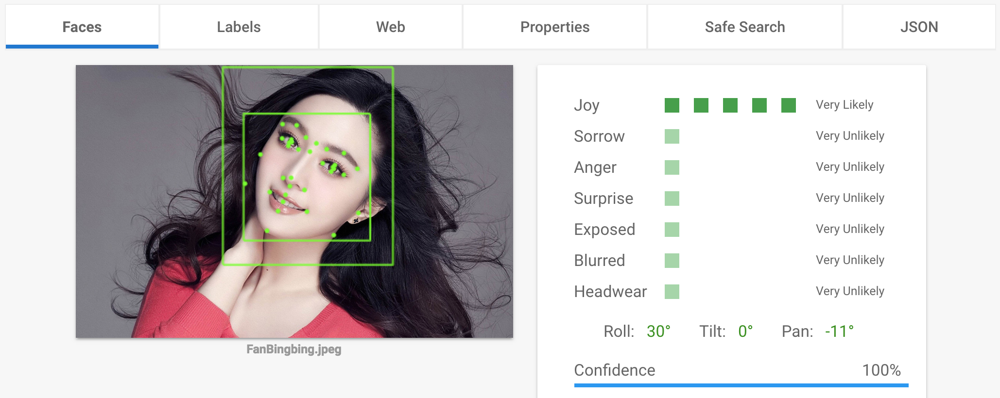

In [222]:
from IPython.display import Image
Image(filename='./demo/CloudVision.png', width=800, height=800) 

## Install Google Cloud Vision API client library

In [203]:
!pip install --upgrade google-cloud-vision

Requirement already up-to-date: google-cloud-vision in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages
Requirement already up-to-date: google-api-core[grpc]<2.0.0dev,>=0.1.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-cloud-vision)
Requirement already up-to-date: google-auth<2.0.0dev,>=0.4.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0dev,>=0.1.0->google-cloud-vision)
Requirement already up-to-date: requests<3.0.0dev,>=2.18.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0dev,>=0.1.0->google-cloud-vision)
Requirement already up-to-date: pytz in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0dev,>=0.1.0->google-cloud-vision)
Requirement already up-to-date: six>=1.10.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0d

In [206]:
!python ./python-docs-samples/vision/cloud-client/detect/detect.py --help

usage: detect.py [-h]
                 {faces,faces-uri,labels,labels-uri,landmarks,landmarks-uri,text,text-uri,logos,logos-uri,safe-search,safe-search-uri,properties,properties-uri,web,web-uri,web-geo,web-geo-uri,crophints,crophints-uri,document,document-uri}
                 ...

This application demonstrates how to perform basic operations with the
Google Cloud Vision API.

Example Usage:
python detect.py text ./resources/wakeupcat.jpg
python detect.py labels ./resources/landmark.jpg
python detect.py web ./resources/landmark.jpg
python detect.py web-uri http://wheresgus.com/dog.JPG
python detect.py web-geo ./resources/city.jpg
python detect.py faces-uri gs://your-bucket/file.jpg

For more information, the documentation at
https://cloud.google.com/vision/docs.

positional arguments:
  {faces,faces-uri,labels,labels-uri,landmarks,landmarks-uri,text,text-uri,logos,logos-uri,safe-search,safe-search-uri,properties,properties-uri,web,web-uri,web-geo,web-geo-uri,crophints,crophints-uri,doc

## Detect labels

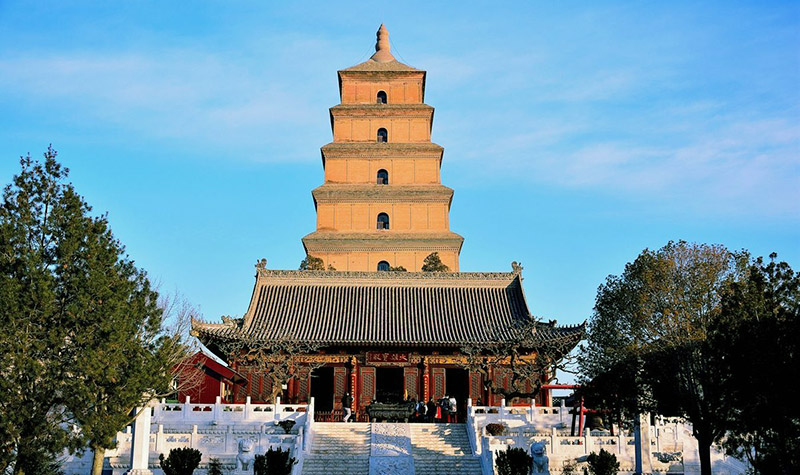

In [230]:
from IPython.display import Image
Image(filename='./demo/DaYanTower.jpg', width=600, height=600) 

In [259]:
from google.cloud import vision
!python ./python-docs-samples/vision/cloud-client/detect/detect.py labels-uri https://s3.amazonaws.com/mylab-images/DaYanTower.jpg

import boto3
client = boto3.client('rekognition', region_name='us-east-1')
response = client.detect_labels(
    Image={
        'S3Object': {
            'Bucket': 'mylab-images',
            'Name': 'DaYanTower.jpg'
        }
    },
    MaxLabels=10,
    MinConfidence=80
)
print("============================")
print("Detect Labels by Rekognition")
print(response['Labels'])

Labels:
chinese architecture
pagoda
landmark
historic site
tower
tourist attraction
sky
temple
temple
place of worship
Detect Labels by Rekognition
[{'Name': 'Architecture', 'Confidence': 98.72064208984375}, {'Name': 'Building', 'Confidence': 98.72064208984375}, {'Name': 'Pagoda', 'Confidence': 98.72064208984375}, {'Name': 'Shrine', 'Confidence': 98.72064208984375}, {'Name': 'Temple', 'Confidence': 98.72064208984375}, {'Name': 'Worship', 'Confidence': 98.72064208984375}, {'Name': 'Bell Tower', 'Confidence': 82.09954071044922}, {'Name': 'Tower', 'Confidence': 82.09954071044922}]


## Detect logo
Logo Detection detects popular product logos within an image.
* https://cloud.google.com/vision/docs/detecting-logos
* No such feature in Rekognition

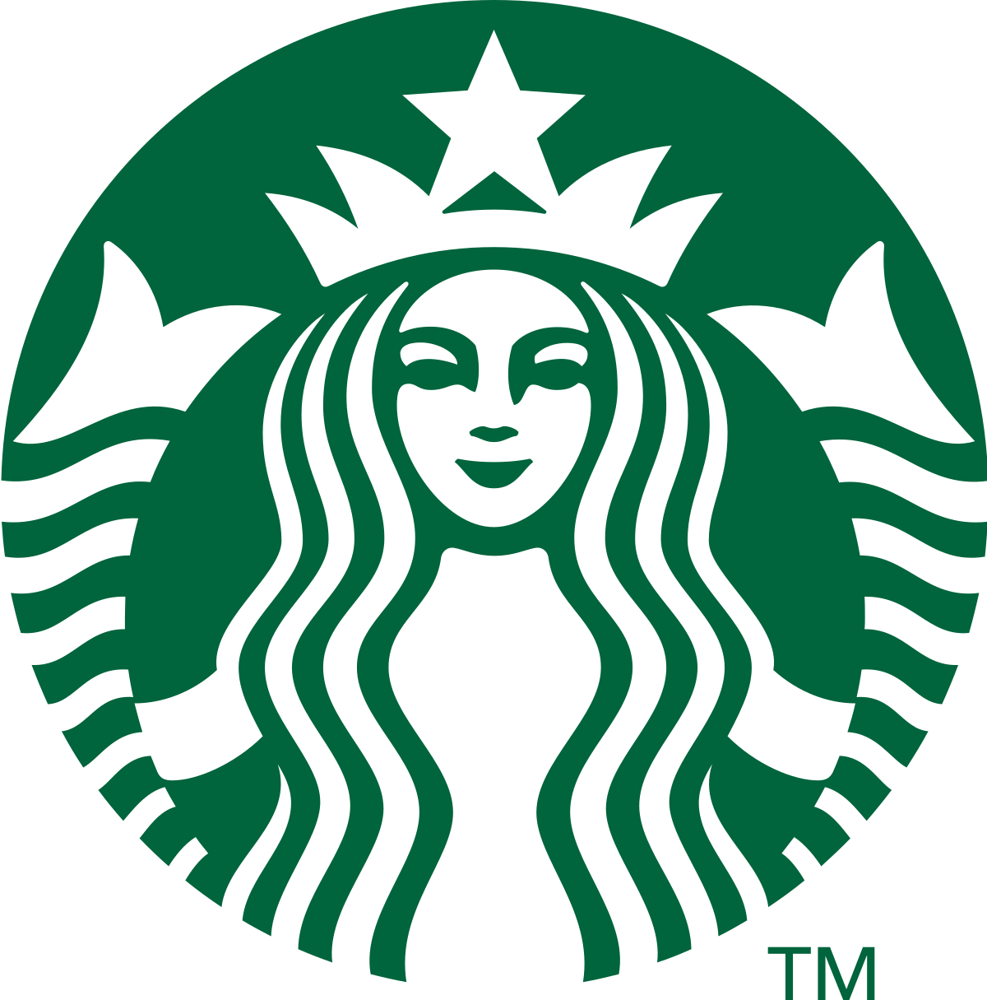

In [145]:
from IPython.display import Image
Image(filename='./demo/Starbucks.png', width=300, height=300) 

In [219]:
print("Test Detect Logo")
!python ./python-docs-samples/vision/cloud-client/detect/detect.py logos ./demo/Starbucks.png

import boto3
client = boto3.client('rekognition', region_name='us-east-1')
response = client.detect_labels(
    Image={
        'S3Object': {
            'Bucket': 'mylab-images',
            'Name': 'Starbucks.png'
        }
    },
    MaxLabels=5,
    MinConfidence=80
)
print("============================")
print("Detect Labels by Rekognition")
print(response['Labels'])

Test Detect Logo
Logos:
Starbucks
Detect Labels by Rekognition
[{'Name': 'Logo', 'Confidence': 98.92930603027344}, {'Name': 'Trademark', 'Confidence': 98.92930603027344}]


## Detect landmarks
Landmark Detection detects popular natural and man-made structures within an image.
* https://cloud.google.com/vision/docs/detecting-landmarks
* No such feature in Rekognition

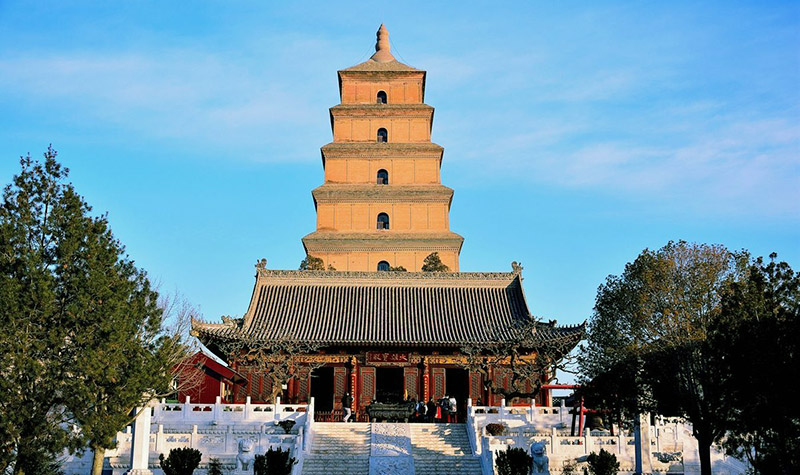

In [157]:
from IPython.display import Image
Image(filename='./demo/DaYanTower.jpg', width=600, height=600)

In [165]:
print("Test Detect Landmark")
!python ./python-docs-samples/vision/cloud-client/detect/detect.py landmarks ./demo/DaYanTower.jpg

import boto3
client = boto3.client('rekognition', region_name='us-east-1')
response = client.detect_labels(
    Image={
        'S3Object': {
            'Bucket': 'mylab-images',
            'Name': 'DaYanTower.jpg'
        }
    },
    MaxLabels=5,
    MinConfidence=80
)
print("============================")
print("Detect Labels by Rekognition")
print(response['Labels'])

Test Detect Landmark
Landmarks:
Giant Wild Goose Pagoda
Latitude 34.2195
Longitude 108.959333
Detect Labels by Rekognition
[{'Name': 'Architecture', 'Confidence': 98.72064208984375}, {'Name': 'Building', 'Confidence': 98.72064208984375}, {'Name': 'Pagoda', 'Confidence': 98.72064208984375}, {'Name': 'Shrine', 'Confidence': 98.72064208984375}, {'Name': 'Temple', 'Confidence': 98.72064208984375}]


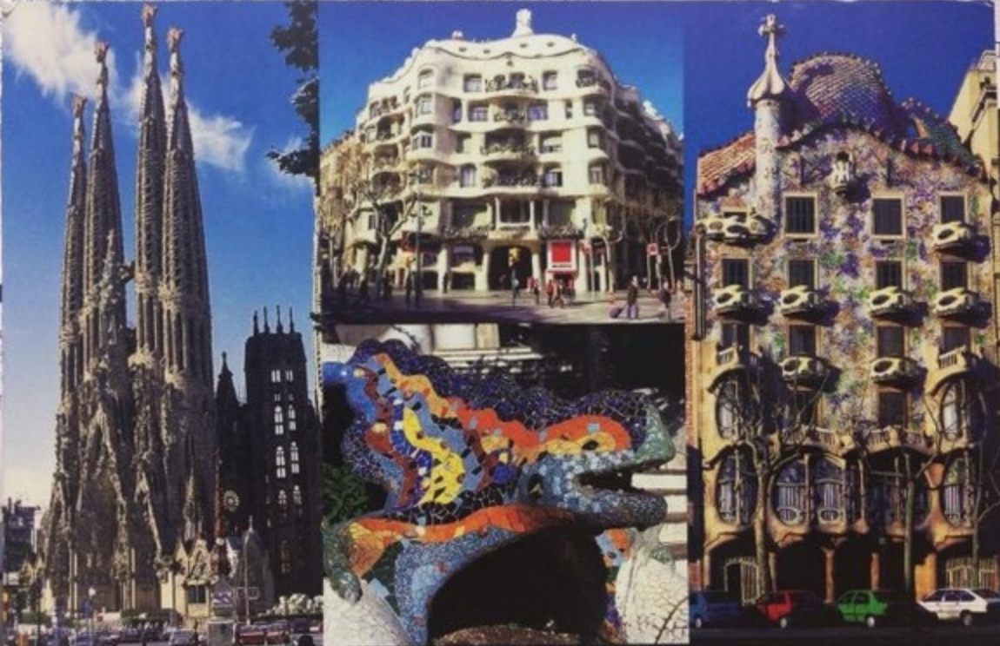

In [234]:
from IPython.display import Image
Image(filename='./demo/Barcelona.png', width=600, height=600)

In [235]:
print("Test Detect Landmark")
!python ./python-docs-samples/vision/cloud-client/detect/detect.py landmarks ./demo/Barcelona.png

import boto3
client = boto3.client('rekognition', region_name='us-east-1')
response = client.detect_labels(
    Image={
        'S3Object': {
            'Bucket': 'mylab-images',
            'Name': 'Barcelona.png'
        }
    },
    MaxLabels=5,
    MinConfidence=80
)
print("============================")
print("Detect Labels by Rekognition")
print(response['Labels'])

Test Detect Landmark
Landmarks:
Casa Batlló
Latitude 41.391718000000004
Longitude 2.164974
Casa Mila
Latitude 41.39516
Longitude 2.161756
Park Güell
Latitude 41.41371050416599
Longitude 2.1528053283691406
Detect Labels by Rekognition
[{'Name': 'Art', 'Confidence': 97.70633697509766}, {'Name': 'Mosaic', 'Confidence': 97.70633697509766}, {'Name': 'Tile', 'Confidence': 97.70633697509766}, {'Name': 'Architecture', 'Confidence': 91.91944885253906}, {'Name': 'Building', 'Confidence': 91.91944885253906}]


## OCR (Text in Image)
* https://cloud.google.com/vision/docs/languages
* 56 languages supported

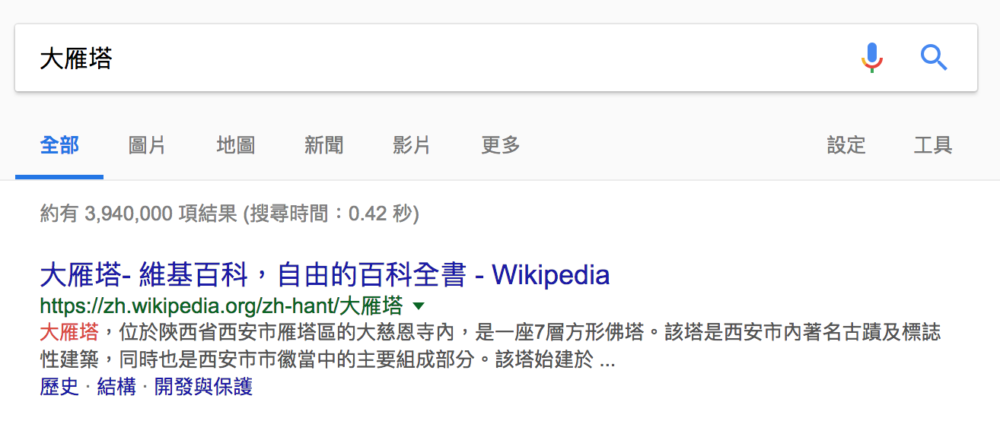

In [167]:
from IPython.display import Image
Image(filename='./demo/OCR.png', width=600, height=600)

In [232]:
print("Test Detect Texts")
!python ./python-docs-samples/vision/cloud-client/detect/detect.py text ./demo/OCR.png

import boto3
client = boto3.client('rekognition', region_name='us-east-1')
response = client.detect_text(
    Image={
        'S3Object': {
            'Bucket': 'mylab-images',
            'Name': 'OCR.png'
        }
    }
)
print("============================")
print("Detect Text by Rekognition")
for i in response["TextDetections"]:
    print(i["DetectedText"])

Test Detect Texts
Texts:

"大雁塔
全部 圖片 地圖 新聞 影片 更多
設定 1具
約有3,940,000項結果(搜尋時間: 0.42秒)
大雁塔-維基百科,自由的百科全書-Wikipedia
https://zh.wikipedia.org/zh-hant/大雁塔▼
大雁塔,位於陝西省西安市雁塔區的大慈恩寺內,是一座7層方形佛塔。該塔是西安市內著名古蹟及標誌
性建築,同時也是西安市市徽當中的主要組成部分。該塔始建於
歷史,結構,開發與保護
兹因
"
bounds: (50,58),(1250,58),(1250,519),(50,519)

"大"
bounds: (50,63),(81,60),(83,89),(53,92)

"雁塔"
bounds: (82,63),(145,58),(148,89),(85,95)

"全部"
bounds: (53,177),(102,177),(102,201),(53,201)

"圖片"
bounds: (169,177),(214,177),(214,201),(169,201)

"地圖"
bounds: (284,177),(333,177),(333,201),(284,201)

"新聞"
bounds: (400,177),(449,177),(449,201),(400,201)

"影片"
bounds: (516,177),(562,177),(562,201),(516,201)

"更多"
bounds: (632,177),(681,177),(681,201),(632,201)

"設定"
bounds: (1087,177),(1136,177),(1136,201),(1087,201)

"1"
bounds: (1200,178),(1224,178),(1224,200),(1200,200)

"具"
bounds: (1226,177),(1250,177),(1250,201),(1226,201)

"約有"
bounds: (53,267),(102,267),(102,291),(53,291)

"3,940,000"
bounds: (111,269),(225,269),(225,292),(111,292)

"項"
bounds: 

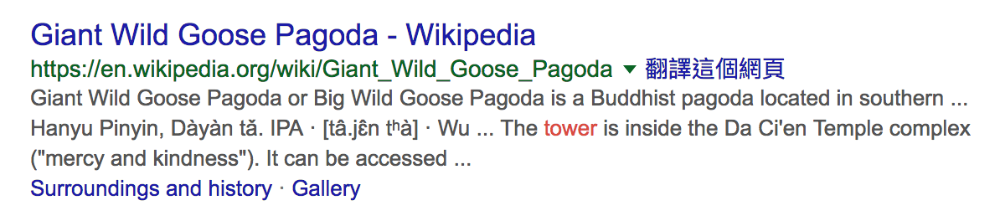

In [171]:
from IPython.display import Image
Image(filename='./demo/OCR_English.png', width=600, height=600)

In [183]:
print("Test Detect Texts")
!python /home/ec2-user/SageMaker/python-docs-samples/vision/cloud-client/detect/detect.py text ./demo/OCR_English.png

import boto3
client = boto3.client('rekognition', region_name='us-east-1')
response = client.detect_text(
    Image={
        'S3Object': {
            'Bucket': 'mylab-images',
            'Name': 'OCR_English.png'
        }
    }
)
print("============================")
print("Detect Text by Rekognition")
for i in response["TextDetections"]:
    print(i["DetectedText"])

Test Detect Texts
Texts:

"Giant Wild Goose Pagoda - Wikipedia
https://en.wikipedia.org/wiki/Giant-Wild-Goose. Pagoda ▼翻譯這個網頁
Giant Wild Goose Pagoda or Big Wild Goose Pagoda is a Buddhist pagoda located in southerrn
Hanyu Pinyin, Dàyàn tă. PA . [ajễn thà] . Wu The tower is inside the Da Cien Temple complex
("mercy and kindness"). It can be accessed
Surroundings and history Gallery
"
bounds: (35,25),(1158,25),(1158,250),(35,250)

"Giant"
bounds: (35,26),(121,26),(121,53),(35,53)

"Wild"
bounds: (131,26),(199,26),(199,53),(131,53)

"Goose"
bounds: (212,25),(316,25),(316,53),(212,53)

"Pagoda"
bounds: (328,26),(449,26),(449,60),(328,60)

"-"
bounds: (461,41),(473,41),(473,46),(461,46)

"Wikipedia"
bounds: (483,26),(638,26),(638,60),(483,60)

"https://en.wikipedia.org/wiki/Giant-Wild-Goose"
bounds: (35,70),(617,70),(617,97),(35,97)

"."
bounds: (617,70),(628,70),(628,90),(617,90)

"Pagoda"
bounds: (641,70),(730,70),(730,97),(641,97)

"▼"
bounds: (743,76),(758,76),(758,85),(743,85)

"翻譯"
b

## Detect dicument text
* No such feature in Rekognition

In [189]:
#!pip install google-cloud-storage
print("Test Detect Texts")
!python ./python-docs-samples/vision/cloud-client/detect/detect_pdf.py --gcs-source-uri gs://gcpcloudvision/OCR_PDF.pdf --gcs-destination-uri gs://gcpcloudvision/

You are using pip version 9.0.1, however version 10.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Test Detect Texts
Waiting for the operation to finish.
Traceback (most recent call last):
  File "/home/ec2-user/SageMaker/python-docs-samples/vision/cloud-client/detect/detect_pdf.py", line 110, in <module>
    async_detect_document(args.gcs_source_uri, args.gcs_destination_uri)
  File "/home/ec2-user/SageMaker/python-docs-samples/vision/cloud-client/detect/detect_pdf.py", line 71, in async_detect_document
    bucket_name = match.group(1)
AttributeError: 'NoneType' object has no attribute 'group'


## Detect faces
* https://developers.google.com/android/reference/com/google/android/gms/vision/face/Landmark

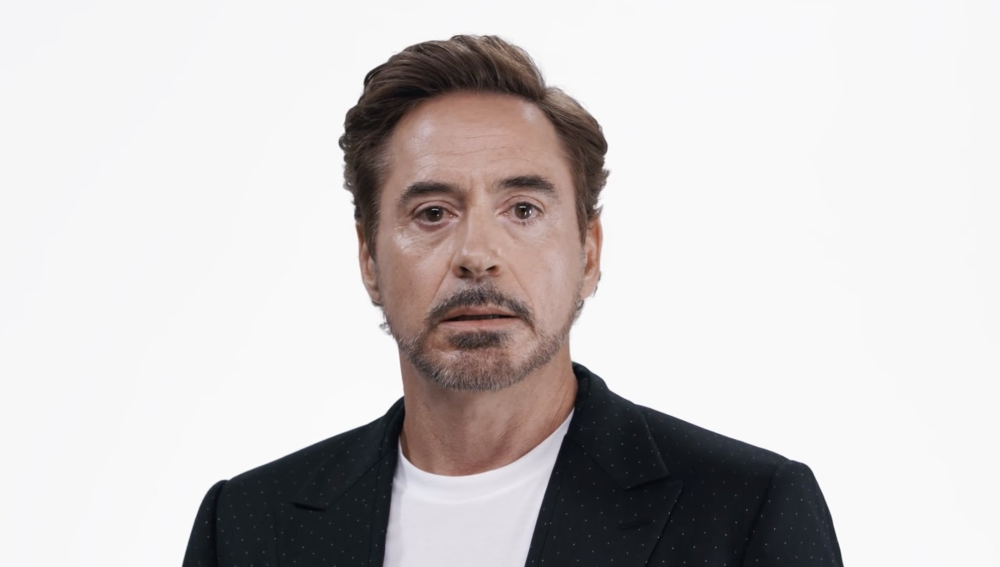

In [236]:
from IPython.display import Image
Image(filename='./demo/RobertDowneyJr3.jpg', width=600, height=600) 

In [240]:
!python ./python-docs-samples/vision/cloud-client/detect/detect.py faces ./demo/RobertDowneyJr3.jpg

face_annotations {
  bounding_poly {
    vertices {
      x: 582
      y: 99
    }
    vertices {
      x: 1176
      y: 99
    }
    vertices {
      x: 1176
      y: 790
    }
    vertices {
      x: 582
      y: 790
    }
  }
  fd_bounding_poly {
    vertices {
      x: 648
      y: 237
    }
    vertices {
      x: 1099
      y: 237
    }
    vertices {
      x: 1099
      y: 688
    }
    vertices {
      x: 648
      y: 688
    }
  }
  landmarks {
    type: LEFT_EYE
    position {
      x: 788.826171875
      y: 388.44915771484375
      z: -7.930139690870419e-05
    }
  }
  landmarks {
    type: RIGHT_EYE
    position {
      x: 951.813720703125
      y: 382.59356689453125
      z: -5.79936408996582
    }
  }
  landmarks {
    type: LEFT_OF_LEFT_EYEBROW
    position {
      x: 722.1428833007812
      y: 359.50439453125
      z: 23.403076171875
    }
  }
  landmarks {
    type: RIGHT_OF_LEFT_EYEBROW
    position {
      x: 824.0220947265625
      y: 342.57659912109375
      z: -29

In [239]:
#With Amazon Rekognition
import boto3

client = boto3.client('rekognition', region_name='us-east-1')
response = client.detect_faces(
    Image={
        'S3Object': {
            'Bucket': 'mylab-images',
            'Name': 'RobertDowneyJr3.jpg'
        }
    },
    Attributes=[
        'ALL',
    ]
)
print(response)

{'FaceDetails': [{'BoundingBox': {'Width': 0.28312501311302185, 'Height': 0.4994487464427948, 'Left': 0.33687499165534973, 'Top': 0.1819184124469757}, 'AgeRange': {'Low': 45, 'High': 65}, 'Smile': {'Value': False, 'Confidence': 99.07078552246094}, 'Eyeglasses': {'Value': False, 'Confidence': 99.98978424072266}, 'Sunglasses': {'Value': False, 'Confidence': 99.9428482055664}, 'Gender': {'Value': 'Male', 'Confidence': 99.9291763305664}, 'Beard': {'Value': False, 'Confidence': 51.07599639892578}, 'Mustache': {'Value': True, 'Confidence': 94.83071899414062}, 'EyesOpen': {'Value': True, 'Confidence': 99.9998779296875}, 'MouthOpen': {'Value': False, 'Confidence': 96.4911880493164}, 'Emotions': [{'Type': 'CONFUSED', 'Confidence': 30.140161514282227}, {'Type': 'CALM', 'Confidence': 23.595916748046875}, {'Type': 'SAD', 'Confidence': 6.353294849395752}], 'Landmarks': [{'Type': 'eyeLeft', 'X': 0.4334675967693329, 'Y': 0.3787696063518524}, {'Type': 'eyeRight', 'X': 0.5229334831237793, 'Y': 0.372254

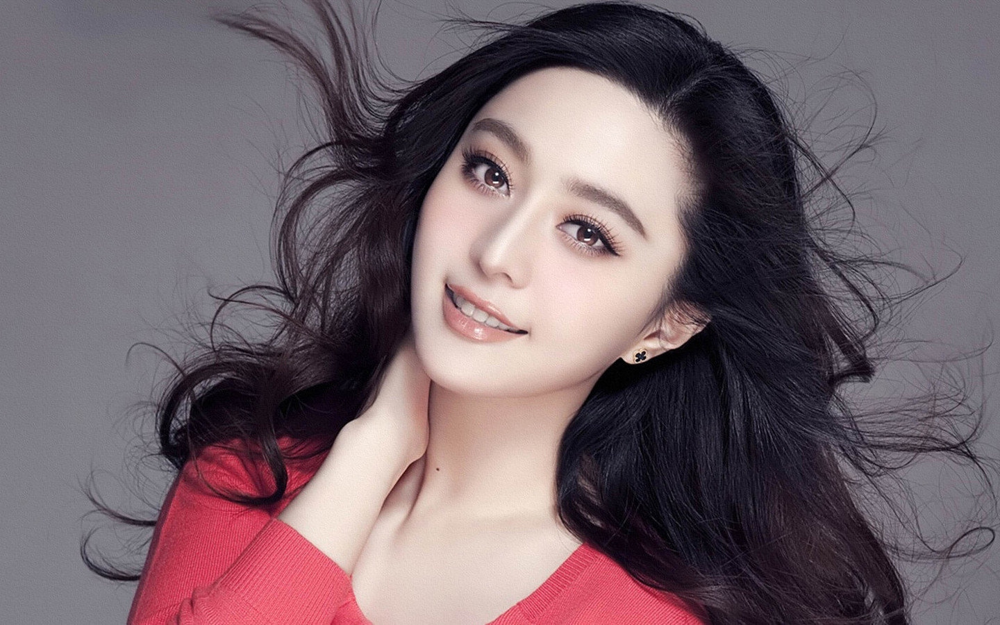

In [191]:
from IPython.display import Image
(filename='./demo/FanBingbing.jpeg', width=600, height=600) 

In [241]:
!python ./python-docs-samples/vision/cloud-client/detect/detect.py web ./demo/FanBingbing.jpeg

import boto3
client = boto3.client('rekognition', region_name='us-east-1')
response = client.recognize_celebrities(
    Image={
        'S3Object': {
            'Bucket': 'mylab-images',
            'Name': 'FanBingbing.jpeg'
        }
    }
)
print("============================")
print("Detect Recognize Celebrities by Rekognition")
print(response)
#for i in response["TextDetections"]:
#    print(i["DetectedText"])


Best guess label: fan bing bing

10 Pages with matching images found:

	Page url   : http://paperlief.com/fan-bingbing/fan-bingbing-fashion-wallpaper-2.html
	1 Partial Matches found: 
		Image url  : http://paperlief.com/images450_300/fan-bingbing-fashion-wallpaper-4.jpg

	Page url   : http://paperlief.com/fan-bingbing/
	1 Partial Matches found: 
		Image url  : http://paperlief.com/images480_300/fan-bingbing-fashion-wallpaper-4.jpg

	Page url   : http://lemerg.com/973063.html
	1 Full Matches found: 
		Image url  : http://lemerg.com/data/wallpapers/16/947328.jpg

	Page url   : http://lemerg.com/947328.html
	1 Full Matches found: 
		Image url  : http://lemerg.com/data/wallpapers/16/947328.jpg

	Page url   : https://www.aliexpress.com/item/Free-Ship-Fashion-Home-Decoration-Custom-Fan-Bingbing-Classic-Photo-Wallpaper-Stylish-Poster-50x76cm-Wall-Sticker/32753632863.html
	2 Full Matches found: 
		Image url  : https://ae01.alicdn.com/kf/HTB1pfNZNVXXXXbLXFXXq6xXFXXXl/Free-Ship-Fashion-Home-Dec

## Detects image properties
* No such feature in Rekognition

In [255]:
!python ./python-docs-samples/vision/cloud-client/detect/detect.py properties ./demo/FanBingbing.jpeg

Properties:
fraction: 0.40304964780807495
	r: 120.0
	g: 117.0
	b: 126.0
	a: 
fraction: 0.1599290817975998
	r: 25.0
	g: 21.0
	b: 30.0
	a: 
fraction: 0.026524823158979416
	r: 206.0
	g: 72.0
	b: 96.0
	a: 
fraction: 0.0395035445690155
	r: 240.0
	g: 221.0
	b: 213.0
	a: 
fraction: 0.05460992828011513
	r: 54.0
	g: 47.0
	b: 57.0
	a: 
fraction: 0.05829787254333496
	r: 90.0
	g: 83.0
	b: 93.0
	a: 
fraction: 0.02780141867697239
	r: 39.0
	g: 21.0
	b: 32.0
	a: 
fraction: 0.03645389899611473
	r: 218.0
	g: 197.0
	b: 190.0
	a: 
fraction: 0.01843971572816372
	r: 61.0
	g: 39.0
	b: 51.0
	a: 
fraction: 0.025177305564284325
	r: 221.0
	g: 189.0
	b: 186.0
	a: 


In [256]:
!python ./python-docs-samples/vision/cloud-client/detect/detect.py crophints ./demo/FanBingbing.jpeg


Crop Hint: 0
bounds: (0,0),(1439,0),(1439,809),(0,809)


# Cloud Video Intelligence API
Google Cloud Video Intelligence makes videos searchable, and discoverable, by extracting metadata with an easy to use REST API. You can now search every moment of every video file in your catalog. It quickly annotates videos stored in Google Cloud Storage, and helps you identify key entities (nouns) within your video; and when they occur within the video. Separate signal from noise, by retrieving relevant information within the entire video, shot-by-shot, -or per frame.
* https://cloud.google.com/video-intelligence/
* Label Detection: Detect entities within the video, such as "dog", "flower" or "car".
* Shot Change Detection: Detect scene changes within the video.
* Explicit Content Detection: Detect adult content within a video.
* Video Transcription (ALPHA): Automatically transcribes video content in English. More languages will be added in future releases.

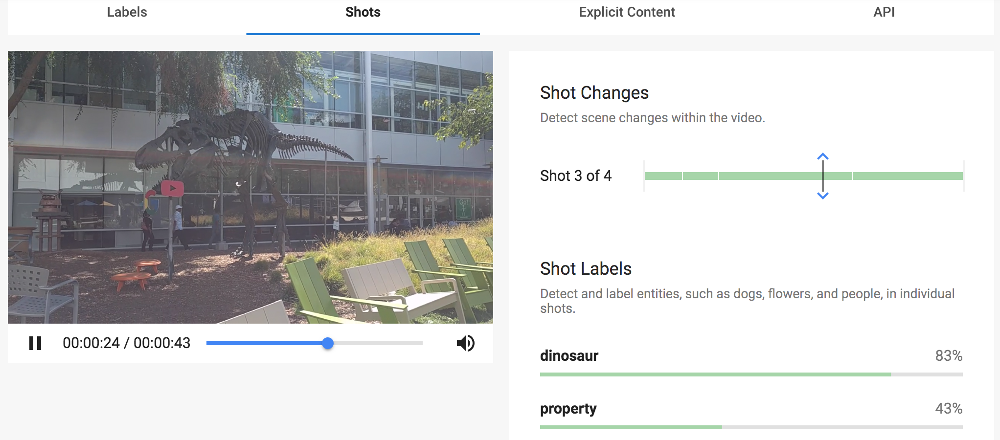

In [215]:
from IPython.display import Image
Image(filename='./demo/VisionVideoShot.png', width=600, height=600) 

## Install Google Cloud Video Intelligence API client library

In [36]:
!pip install --upgrade google-cloud-videointelligence

Requirement already up-to-date: google-cloud-videointelligence in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages
Requirement already up-to-date: google-api-core[grpc]<2.0.0dev,>=0.1.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-cloud-videointelligence)
Requirement already up-to-date: protobuf>=3.0.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0dev,>=0.1.0->google-cloud-videointelligence)
Requirement already up-to-date: six>=1.10.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0dev,>=0.1.0->google-cloud-videointelligence)
Requirement already up-to-date: setuptools>=34.0.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0dev,>=0.1.0->google-cloud-videointelligence)
Requirement already up-to-date: pytz in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages 

In [309]:
from IPython.display import HTML
HTML("""
<video width="320" height="240" controls>
  <source src="./demo/gbikes_dinosaur.mp4" type="video/mp4">
</video>
""")

In [306]:
from google.cloud import videointelligence
!python ./python-docs-samples/video/cloud-client/quickstart/quickstart.py


Processing video for label annotations:

Finished processing.
Video label description: dinosaur
	Segment 0: 0.0s to 42.766666s
	Confidence: 0.9449004530906677


Video label description: bicycle
	Label category description: vehicle
	Segment 0: 0.0s to 42.766666s
	Confidence: 0.47582101821899414


Video label description: tyrannosaurus
	Label category description: dinosaur
	Segment 0: 0.0s to 42.766666s
	Confidence: 0.42222222685813904


Video label description: tree
	Label category description: plant
	Segment 0: 0.0s to 42.766666s
	Confidence: 0.4231415390968323




In [310]:
from google.cloud import videointelligence
!python ./python-docs-samples/video/cloud-client/shotchange/shotchange.py gs://cloudmleap/video/next/gbikes_dinosaur.mp4


Processing video for shot change annotations:

Finished processing.
	Shot 0: 0.0 to 5.166666
	Shot 1: 5.233333 to 10.066666
	Shot 2: 10.1 to 28.133333
	Shot 3: 28.166666 to 42.766666


# Google Cloud Translation API
* https://cloud.google.com/translate/docs/languages
* Programmatic Access: Translation API is accessible via a standard Google REST API. See sample code for different programming languages including Python, Objective C and Ruby.
* Text Translation: Translation API supports more than 100 languages and thousands of language pairs. You can send in HTML and receive HTML with translated text back. You don't need to extract your source text or reassemble the translated content.
* Language Detection: Detect a document’s language and translate it using RESTful API.
* Continuous Updates: Behind the scenes, Translation API is learning from logs analysis and human translation examples. Existing language pairs improve and new language pairs come online at no additional cost.
* Adjustable Quota: Easily increase your quota from 2M characters per day to 50M per day or request a higher quota.
* Affordable, Easy Pricing: Translation API pricing is based on millions of characters sent. Our pricing schedule is easy to understand and very affordable.

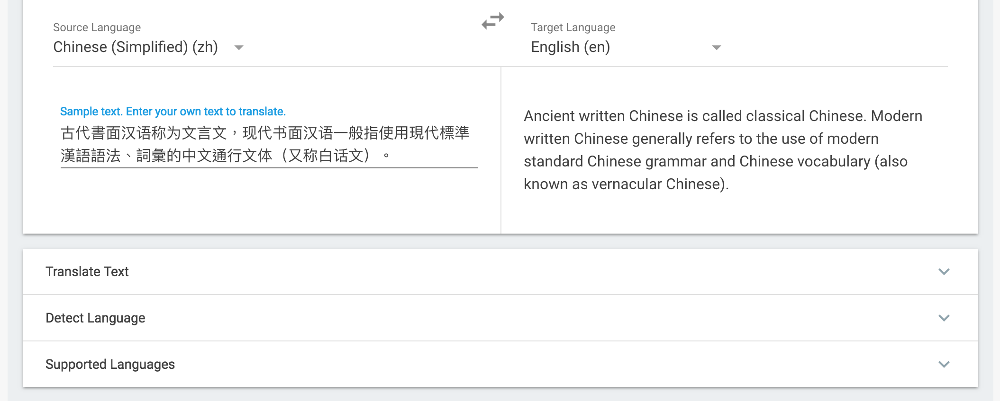

In [308]:
from IPython.display import Image
Image(filename='./demo/CloudTranslation.png', width=600, height=600) 

## Install Google Cloud Translate API client library

In [38]:
!pip install --upgrade google-cloud-translate

Requirement already up-to-date: google-cloud-translate in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages
Requirement already up-to-date: google-api-core<2.0.0dev,>=0.1.1 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-cloud-translate)
Requirement already up-to-date: google-cloud-core<0.29dev,>=0.28.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-cloud-translate)
Requirement already up-to-date: protobuf>=3.0.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core<2.0.0dev,>=0.1.1->google-cloud-translate)
Requirement already up-to-date: six>=1.10.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core<2.0.0dev,>=0.1.1->google-cloud-translate)
Requirement already up-to-date: pytz in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core<2.0.0dev,>=0.1.1->google-cloud-translate)
Requirement alread

In [268]:
from google.cloud import translate
!python /home/ec2-user/SageMaker/python-docs-samples/translate/cloud-client/quickstart.py

import boto3

content="Hello, world! Welcom to GCR Tech Summit!"

translate = boto3.client(service_name='translate', region_name='us-east-1', use_ssl=True)

result = translate.translate_text(Text=content, 
            SourceLanguageCode="en", TargetLanguageCode="zh")
print('Text: ' + content)
print('Translation: ' + result.get('TranslatedText'))
#print('SourceLanguageCode: ' + result.get('SourceLanguageCode'))
#print('TargetLanguageCode: ' + result.get('TargetLanguageCode'))

Text: Hello, world! Welcom to GCR Tech Summit!
Translation: 你好，世界！欢迎来到GCR技术峰会！
Text: Hello, world! Welcom to GCR Tech Summit!
Translation: 你好，世界！ 欢迎来到GCR科技峰会！


In [296]:
!python ./python-docs-samples/translate/cloud-client/snippets.py translate-text zh-CN "<!DOCTYPE html><html><body><h1>My First Heading</h1><p>My first paragraph.</p></body></html>"

print("=========================")
import boto3

content="<!DOCTYPE html><html><body><h1>My First Heading</h1><p>My first paragraph.</p></body></html>"

translate = boto3.client(service_name='translate', region_name='us-east-1', use_ssl=True)

result = translate.translate_text(Text=content, 
            SourceLanguageCode="en", TargetLanguageCode="zh")
print('Text: ' + content)
print('Translation: ' + result.get('TranslatedText'))

Text: <!DOCTYPE html><html><body><h1>My First Heading</h1><p>My first paragraph.</p></body></html>
Translation: <!DOCTYPE html><html><body><h1>我的第一个标题</h1><p>我的第一段。 </p></body></html>
Detected source language: en
Text: <!DOCTYPE html><html><body><h1>My First Heading</h1><p>My first paragraph.</p></body></html>
Translation: <! DOCTYPE html > <unk>html <unk><unk>body <unk>h1<unk>我的第一个标题 <unk>/h1 <unk>p<unk>我的第一段。 <unk>/p<unk>/body<unk>


# Google Cloud Speech-to-Text
Google Cloud Speech-to-Text enables developers to convert audio to text by applying powerful neural network models in an easy to use API. The API recognizes 120 languages and variants, to support your global user base. You can enable voice command-and-control, transcribe audio from call centers, and more. It can process real-time streaming or pre-recorded audio, using Google’s machine learning technology.

* https://cloud.google.com/speech-to-text/docs/languages
* Automatic Speech Recognition: Automatic Speech Recognition (ASR) powered by deep learning neural networking to power your applications like voice search or speech transcription.
* Global Vocabulary: Recognizes 120 languages and variants with an extensive vocabulary.
* Word Hints: Speech recognition can be customized to a specific context by providing a set of words and phrases that are likely to be spoken. Especially useful for adding custom words and names to the vocabulary and in voice-control use cases.
* Real-time Streaming or Pre-recorded Audio Support: Audio input can be streamed from by an application’s microphone or sent from a pre-recorded audio file (inline or through Google Cloud Storage). Multiple audio encodings are supported, including FLAC, AMR, PCMU and Linear-16.
* Noise Robustness: Handles noisy audio from many environments without requiring additional noise cancellation.
* Inappropriate Content Filtering: Filter inappropriate content in text results for some languages.
* Automatic Punctuation: Accurately punctuates transcriptions (i.e. commas, questions marks, and periods) with machine learning.
* Model Selection (BETA): Choose from a selection of four pre-built models: default, voice commands and search, phone calls, and video transcription.

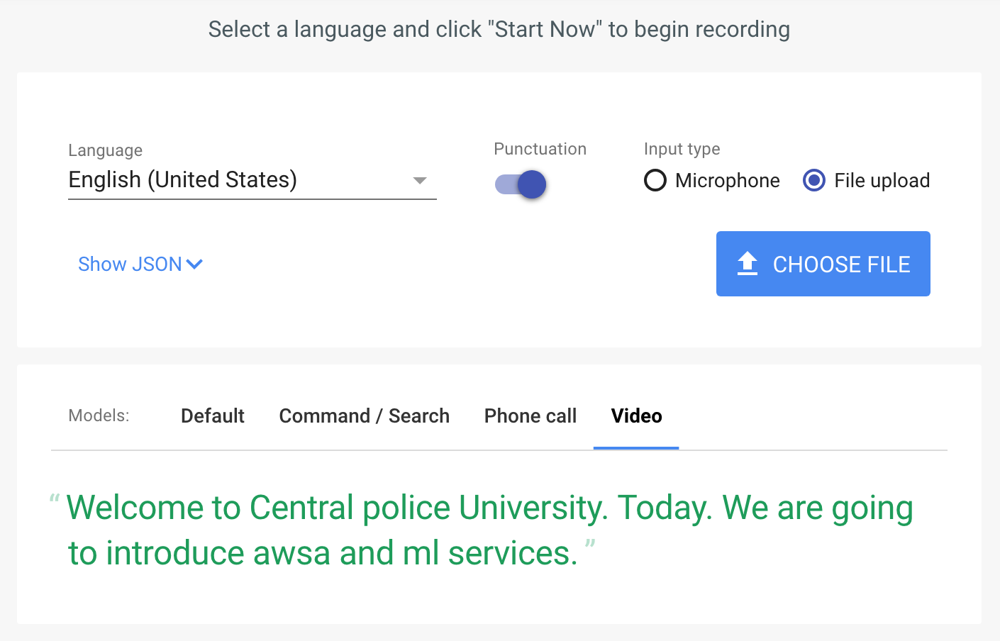

In [300]:
from IPython.display import Image
Image(filename='./demo/CloudSpeechToText.png', width=600, height=600) 

## Install Google Cloud Speech API client library

In [97]:
!pip install --upgrade google-cloud-speech

Requirement already up-to-date: google-cloud-speech in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages
Requirement already up-to-date: google-api-core[grpc]<2.0.0dev,>=0.1.4 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-cloud-speech)
Requirement already up-to-date: setuptools>=34.0.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0dev,>=0.1.4->google-cloud-speech)
Requirement already up-to-date: six>=1.10.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0dev,>=0.1.4->google-cloud-speech)
Requirement already up-to-date: requests<3.0.0dev,>=2.18.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0dev,>=0.1.4->google-cloud-speech)
Requirement already up-to-date: protobuf>=3.0.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0

In [332]:
import IPython
IPython.display.Audio("./demo/audio1.wav")

In [305]:
!python ./python-docs-samples/speech/cloud-client/quickstart.py

results {
  alternatives {
    transcript: "welcome to Central police University"
    confidence: 0.9625647068023682
  }
}

Transcript: welcome to Central police University


In [331]:
import IPython
IPython.display.Audio("./demo/audio_chinese.wav")

In [105]:
from google.cloud import speech
!python ./python-docs-samples/speech/cloud-client/quickstart_chinese.py

results {
  alternatives {
    transcript: "\344\275\240\345\245\275\346\255\241\350\277\216\344\276\206\345\210\260GTR\347\247\221\346\212\200\345\263\260\346\234\203"
    confidence: 0.9264843463897705
  }
}

Transcript: 你好歡迎來到GTR科技峰會


In [111]:
!python ./samples-aws/transcribe.py

In progress...
In progress...
In progress...
In progress...
In progress...
In progress...
In progress...
In progress...
In progress...
In progress...
In progress...
In progress...
In progress...
[{'transcript': "Welcome to central police university. Today, we're going to introduce a w, c a and m l services."}]


# Google Cloud Natural Language API
* 10 languages supported
* https://cloud.google.com/natural-language/docs/languages
* Syntax Analysis: Extract tokens and sentences, identify parts of speech (PoS) and create dependency parse trees for each sentence.
* Entity Recognition: Identify entities and label by types such as person, organization, location, events, products and media.
* Sentiment Analysis: Understand the overall sentiment expressed in a block of text.
* Content Classification: Classify documents in predefined 700+ categories.
* Multi-Language: Enables you to easily analyze text in multiple languages including English, Spanish, Japanese, Chinese (Simplified and Traditional), French, German, Italian, Korean and Portuguese.
* Integrated REST API: Access via REST API. Text can be uploaded in the request or integrated with Google Cloud Storage.

## Install Google Cloud Language API client library

In [318]:
!pip install --upgrade google-cloud-language

Requirement already up-to-date: google-cloud-language in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages
Requirement already up-to-date: google-api-core[grpc]<2.0.0dev,>=0.1.1 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-cloud-language)
Requirement already up-to-date: pytz in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0dev,>=0.1.1->google-cloud-language)
Requirement already up-to-date: googleapis-common-protos<2.0dev,>=1.5.3 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0dev,>=0.1.1->google-cloud-language)
    100% |████████████████████████████████| 92kB 5.2MB/s ta 0:00:011
Requirement already up-to-date: protobuf>=3.0.0 in /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages (from google-api-core[grpc]<2.0.0dev,>=0.1.1->google-cloud-language)
Requirement already up-to-date: setuptools>=34.0.0 in /home/ec2-user

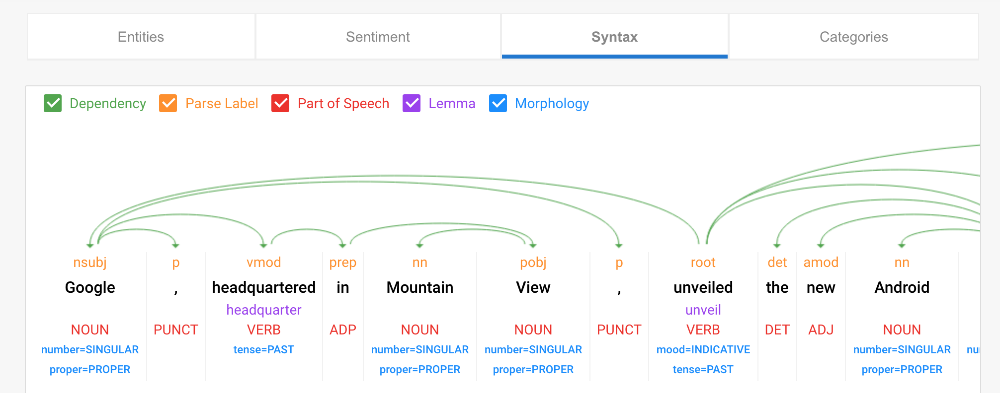

In [298]:
from IPython.display import Image
Image(filename='./demo/CloudNaturalLanguage.png', width=600, height=600) 

In [327]:
!python ./python-docs-samples/language/cloud-client/v1beta2/snippets.py syntax-text "Welcome to AWS Tech Summit. Today, I am going to introduce AWS AI & ML services"

[text {
  content: "Welcome"
  begin_offset: -1
}
part_of_speech {
  tag: VERB
  mood: INDICATIVE
  tense: PRESENT
}
dependency_edge {
  label: ROOT
}
lemma: "Welcome"
, text {
  content: "to"
  begin_offset: -1
}
part_of_speech {
  tag: ADP
}
dependency_edge {
  label: PREP
}
lemma: "to"
, text {
  content: "AWS"
  begin_offset: -1
}
part_of_speech {
  tag: NOUN
  number: SINGULAR
  proper: PROPER
}
dependency_edge {
  head_token_index: 4
  label: NN
}
lemma: "AWS"
, text {
  content: "Tech"
  begin_offset: -1
}
part_of_speech {
  tag: NOUN
  number: SINGULAR
  proper: PROPER
}
dependency_edge {
  head_token_index: 4
  label: NN
}
lemma: "Tech"
, text {
  content: "Summit"
  begin_offset: -1
}
part_of_speech {
  tag: NOUN
  number: SINGULAR
  proper: PROPER
}
dependency_edge {
  head_token_index: 1
  label: POBJ
}
lemma: "Summit"
, text {
  content: "."
  begin_offset: -1
}
part_of_speech {
  tag: PUNCT
}
dependency_edge {
  label: P
}
lemma: "."
, text {
  content: "Today"
  begin_of

In [322]:
!python python-docs-samples/language/cloud-client/v1beta2/snippets.py -h

usage: snippets.py [-h]
                   {classify-text,classify-file,sentiment-entities-text,sentiment-entities-file,sentiment-text,sentiment-file,entities-text,entities-file,syntax-text,syntax-file}
                   ...

This application demonstrates how to perform basic operations with the
Google Cloud Natural Language API

For more information, the documentation at
https://cloud.google.com/natural-language/docs.

positional arguments:
  {classify-text,classify-file,sentiment-entities-text,sentiment-entities-file,sentiment-text,sentiment-file,entities-text,entities-file,syntax-text,syntax-file}
    classify-text       Classifies content categories of the provided text.
    classify-file       Classifies content categories of the text in a Google
                        Cloud Storage file.
    sentiment-entities-text
                        Detects entity sentiment in the provided text.
    sentiment-entities-file
                        Detects entity sentiment in a Google Cloud